### Introduction



The data here under Analysis has been collected from the siurce https://www.kaggle.com/datasets/saurabhbadole/walmart-super-market-dataset . The analytics performed in the notebook is aimed to predict Consumer Price Index (CPI) and Unemployment rate at varied stores of Walmart in a week after 2013. The data comprises of Timestamps from 2010 to 2013.

Th features include:


*   Store: Store number.

*   Type: The store type.

*   Size: The size of the Store

*   Date: Week of sales data.

*   IsHoliday: Indicates whether the week is a special holiday week.

*   Temperature: Average temperature in the region.

*   Fuel_Price: Cost of fuel in the region.

*   MarkDown1-5: Anonymized data related to promotional markdowns by Walmart.

*   CPI: Consumer price index.

*   Unemployment: Unemployment rate.

*   IsHoliday (features.csv): Indicates whether the week is a special holiday week.

Among the features above CPI and Unemployment are the target variables.

### Data Collection/Cleaning

In [45]:
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.linear_model import Ridge, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsRegressor
import tensorflow as tf
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.linear_model import ElasticNet

In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
from google.colab import drive
from sklearn.preprocessing import LabelEncoder
#drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
df1 = pd.read_csv('Master Data/features.csv',encoding='latin1')
df1

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False
...,...,...,...,...,...,...,...,...,...,...,...,...
8185,45,2013-06-28,76.05,3.639,4842.29,975.03,3.00,2449.97,3169.69,NaN,NaN,False
8186,45,2013-07-05,77.50,3.614,9090.48,2268.58,582.74,5797.47,1514.93,NaN,NaN,False
8187,45,2013-07-12,79.37,3.614,3789.94,1827.31,85.72,744.84,2150.36,NaN,NaN,False
8188,45,2013-07-19,82.84,3.737,2961.49,1047.07,204.19,363.00,1059.46,NaN,NaN,False


In [5]:
df1['Year'] = None
for i in range(df1.shape[0]):
  df1['Year'][i] = int(df1['Date'][i][:4])
df1['Year']
df1['Month'] = None
for i in range(df1.shape[0]):
  df1['Month'][i] = int(df1['Date'][i][5:7])
df1['Day'] = None
for i in range(df1.shape[0]):
  df1['Day'][i] = int(df1['Date'][i][8:])
df1

Streaming output truncated to the last 5000 lines.
<ipython-input-5-7424042eae9d>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Day'][i] = int(df1['Date'][i][8:])
<ipython-input-5-7424042eae9d>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Day'][i] = int(df1['Date'][i][8:])
<ipython-input-5-7424042eae9d>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Day'][i] = int(df1['Date'][i][8:])
<ipython-input-5-7424042e

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Year,Month,Day
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,2010,2,5
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True,2010,2,12
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False,2010,2,19
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False,2010,2,26
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False,2010,3,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8185,45,2013-06-28,76.05,3.639,4842.29,975.03,3.00,2449.97,3169.69,NaN,NaN,False,2013,6,28
8186,45,2013-07-05,77.50,3.614,9090.48,2268.58,582.74,5797.47,1514.93,NaN,NaN,False,2013,7,5
8187,45,2013-07-12,79.37,3.614,3789.94,1827.31,85.72,744.84,2150.36,NaN,NaN,False,2013,7,12
8188,45,2013-07-19,82.84,3.737,2961.49,1047.07,204.19,363.00,1059.46,NaN,NaN,False,2013,7,19


In [6]:
df1['Year'].value_counts()

Year
2011    2340
2012    2340
2010    2160
2013    1350
Name: count, dtype: int64

In [7]:
df2 = pd.read_csv('Master Data/stores.csv',encoding='latin1')
df2.head()

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


In [8]:
df2['Size'].nunique()

40

In [9]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45 entries, 0 to 44
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Store   45 non-null     int64 
 1   Type    45 non-null     object
 2   Size    45 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 1.2+ KB


In [10]:
df = df1.merge(df2[['Store', 'Type', 'Size']], on='Store', how='left')
df.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Year,Month,Day,Type,Size
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False,2010,2,5,A,151315
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True,2010,2,12,A,151315
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False,2010,2,19,A,151315
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False,2010,2,26,A,151315
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False,2010,3,5,A,151315


In [11]:
le_is_holiday = LabelEncoder()
le_type = LabelEncoder()
# Fit and transform the 'IsHoliday' column
df['IsHoliday'] = le_is_holiday.fit_transform(df['IsHoliday'])
# Fit and transform the 'Type' column
df['Type'] = le_type.fit_transform(df['Type'])
df.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Year,Month,Day,Type,Size
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,0,2010,2,5,0,151315
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,1,2010,2,12,0,151315
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,0,2010,2,19,0,151315
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,0,2010,2,26,0,151315
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,0,2010,3,5,0,151315


In [12]:
df['Year'].value_counts()

Year
2011    2340
2012    2340
2010    2160
2013    1350
Name: count, dtype: int64

In [13]:
df.isnull().sum()

Store              0
Date               0
Temperature        0
Fuel_Price         0
MarkDown1       4158
MarkDown2       5269
MarkDown3       4577
MarkDown4       4726
MarkDown5       4140
CPI              585
Unemployment     585
IsHoliday          0
Year               0
Month              0
Day                0
Type               0
Size               0
dtype: int64

In [14]:
df[df['CPI'].isna()]['Date'].unique()

array(['2013-05-03', '2013-05-10', '2013-05-17', '2013-05-24',
       '2013-05-31', '2013-06-07', '2013-06-14', '2013-06-21',
       '2013-06-28', '2013-07-05', '2013-07-12', '2013-07-19',
       '2013-07-26'], dtype=object)

In [15]:
df[df['Date']<'2013-05-03'].isnull().sum()

Store              0
Date               0
Temperature        0
Fuel_Price         0
MarkDown1       4156
MarkDown2       5164
MarkDown3       4521
MarkDown4       4631
MarkDown5       4140
CPI                0
Unemployment       0
IsHoliday          0
Year               0
Month              0
Day                0
Type               0
Size               0
dtype: int64

In [16]:
df[df['MarkDown1'].notna()]['Year'].value_counts()

Year
2012    2330
2013    1348
2011     354
Name: count, dtype: int64

In [17]:
df[df['MarkDown2'].notna()]['Year'].value_counts()

Year
2012    1577
2013    1051
2011     293
Name: count, dtype: int64

In [18]:
df[df['MarkDown3'].notna()]['Year'].value_counts()

Year
2012    2081
2013    1190
2011     342
Name: count, dtype: int64

In [19]:
df[df['MarkDown4'].notna()]['Year'].value_counts()

Year
2012    2010
2013    1152
2011     302
Name: count, dtype: int64

In [20]:
df[df['MarkDown5'].notna()]['Year'].value_counts()

Year
2012    2340
2013    1350
2011     360
Name: count, dtype: int64

### Feature Engineering/EDA

In [21]:
df.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Year,Month,Day,Type,Size
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,0,2010,2,5,0,151315
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,1,2010,2,12,0,151315
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,0,2010,2,19,0,151315
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,0,2010,2,26,0,151315
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,0,2010,3,5,0,151315


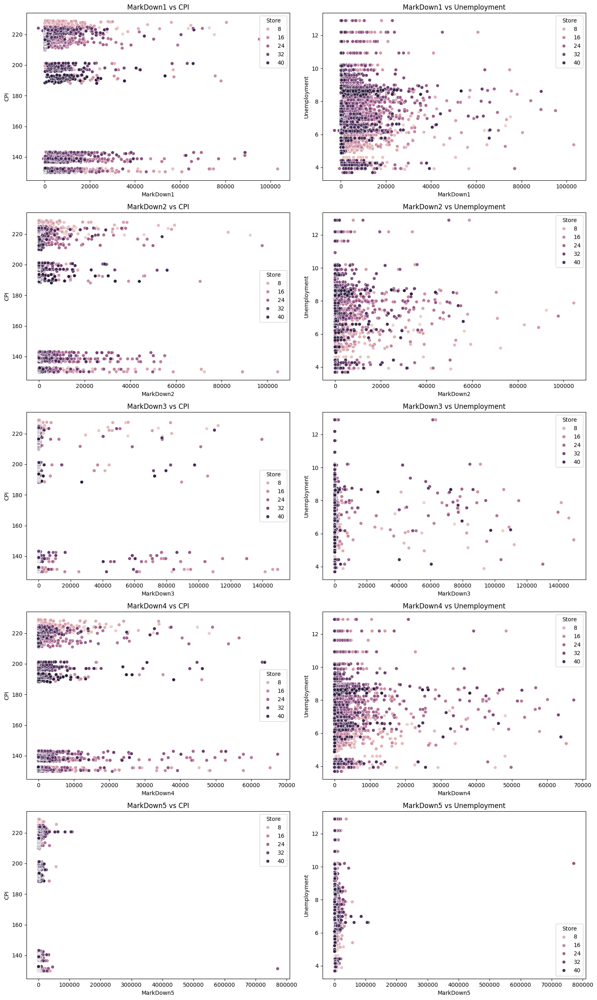

In [22]:
markdown_columns = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']
target_columns = ['CPI', 'Unemployment']

# Create a 5x2 subplot grid
fig, axes = plt.subplots(5, 2, figsize=(15, 25))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each combination of MarkDown columns and target variables
for i, markdown in enumerate(markdown_columns):
    for j, target in enumerate(target_columns):
        sns.scatterplot(x=markdown, y=target, data=df, hue='Store', ax=axes[i*2 + j])
        axes[i*2 + j].set_title(f'{markdown} vs {target}')
        axes[i*2 + j].legend(title='Store', loc='best')
# Adjust layout
plt.tight_layout()
plt.show()

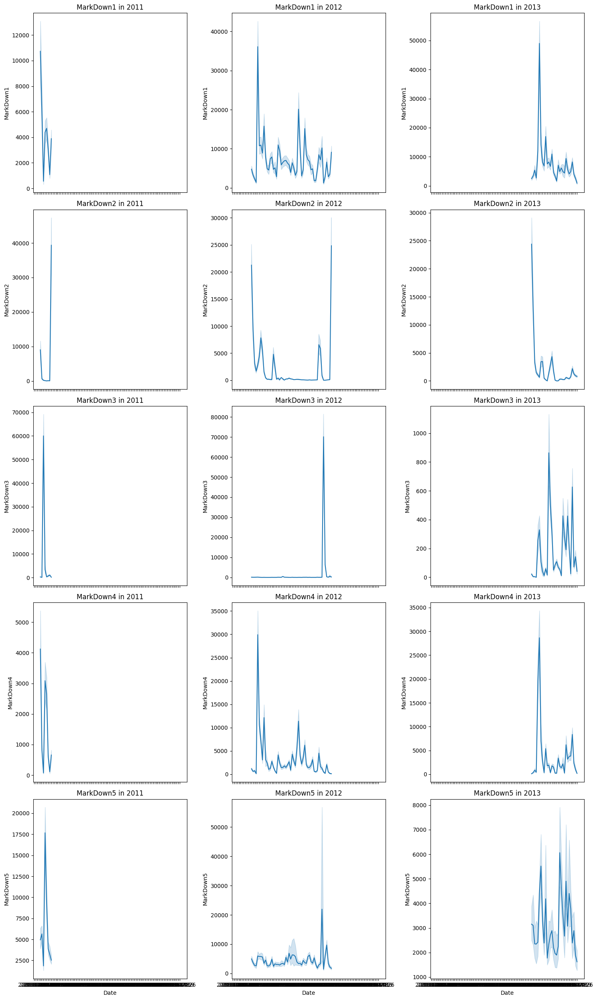

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
markdown_columns = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']
fig, axes = plt.subplots(5, 3, figsize=(15, 25), sharex=True)
for i, markdown in enumerate(markdown_columns):
    for j, year in enumerate([2011, 2012, 2013]):
        ax = axes[i, j]
        sns.lineplot(data=df[df['Year'] == year], x='Date', y=markdown, ax=ax)
        ax.set_title(f'{markdown} in {year}')
        ax.legend().remove()
        if j == 0:
            ax.set_ylabel(markdown)
        if i == len(markdown_columns) - 1:
            ax.set_xlabel('Date')
plt.tight_layout()
plt.show()

Based on the above visualizations, we can deduce that the dependence of all the markdowns on the target variables are very low. Also keeping in mind their very less data in the dataset, we can drop the columns.

In [22]:
from sklearn.preprocessing import LabelEncoder
# Create an instance of LabelEncoder
le_is_holiday = LabelEncoder()
le_type = LabelEncoder()
# Fit and transform the 'IsHoliday' column
df['IsHoliday'] = le_is_holiday.fit_transform(df['IsHoliday'])
# Fit and transform the 'Type' column
df['Type'] = le_type.fit_transform(df['Type'])
df.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Year,Month,Day,Type,Size
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,0,2010,2,5,0,151315
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,1,2010,2,12,0,151315
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,0,2010,2,19,0,151315
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,0,2010,2,26,0,151315
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,0,2010,3,5,0,151315


In [24]:
# dff = df[df['MarkDown1'].notna()]
# dff = dff[dff['MarkDown2'].notna()]
# dff = dff[dff['MarkDown3'].notna()]
# dff = dff[dff['MarkDown4'].notna()]
# dff = dff[dff['MarkDown5'].notna()]
# dff = dff[dff['CPI'].notna()]
# dff.isnull().sum()

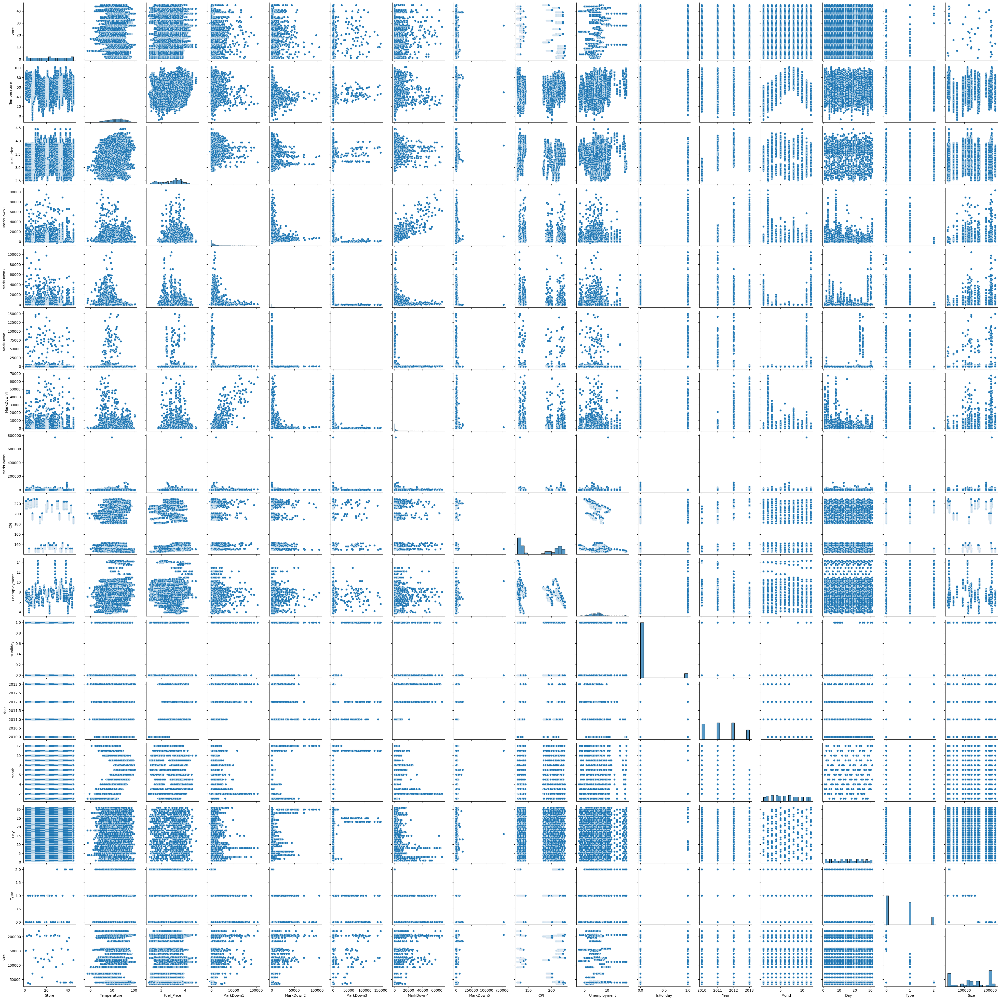

In [23]:
sns.pairplot(df)

In [24]:
df.drop(columns=['Date']).corr()

,Store,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Year,Month,Day,Type,Size
Store,1.000000e+00,-0.020566,0.066682,-0.136967,-0.044223,-0.033279,-0.005174,-0.011970,-0.209282,0.221153,-4.186667e-16,-3.324389e-12,-2.645296e-15,7.524897e-16,2.745977e-01,-2.442698e-01
Temperature,-2.056605e-02,1.000000,0.101354,-0.124979,-0.321888,-0.077552,-0.064194,-0.003241,0.164426,0.150890,-1.619056e-01,-3.837331e-02,2.258098e-01,4.063430e-02,5.656453e-02,-9.334549e-02
Fuel_Price,6.668205e-02,0.101354,1.000000,0.066122,-0.193461,-0.057168,-0.008546,-0.021926,-0.186696,-0.033360,-7.823797e-02,6.577771e-01,-6.595804e-02,2.287986e-02,1.724971e-02,1.507973e-02
MarkDown1,-1.369671e-01,-0.124979,0.066122,1.000000,0.021289,-0.089841,0.810455,0.085967,-0.044327,0.020501,1.526209e-01,8.350274e-02,-1.629712e-01,-2.527162e-01,-2.644613e-01,3.574386e-01
MarkDown2,-4.422331e-02,-0.321888,-0.193461,0.021289,1.000000,-0.053555,-0.046595,-0.008166,-0.044896,-0.001692,2.994476e-01,-1.174368e-01,1.318812e-02,1.748323e-02,-9.243350e-02,1.398825e-01
MarkDown3,-3.327926e-02,-0.077552,-0.057168,-0.089841,-0.053555,1.000000,-0.062785,-0.016026,-0.020166,-0.003464,4.452239e-01,-1.592988e-01,1.988660e-01,1.405108e-01,-4.691559e-02,5.568067e-02
MarkDown4,-5.173997e-03,-0.064194,-0.008546,0.810455,-0.046595,-0.062785,1.000000,0.042952,-0.053868,0.021905,1.348406e-01,8.874169e-02,-1.921093e-01,-3.033235e-01,-1.118254e-01,1.708180e-01
MarkDown5,-1.196994e-02,-0.003241,-0.021926,0.085967,-0.008166,-0.016026,0.042952,1.000000,0.001526,0.031847,-2.462956e-02,-6.617372e-02,5.894966e-02,-4.121927e-02,-1.212131e-01,1.506063e-01
CPI,-2.092824e-01,0.164426,-0.186696,-0.044327,-0.044896,-0.020166,-0.053868,0.001526,1.000000,-0.303110,1.008430e-03,8.486450e-02,-2.312270e-03,9.747420e-04,-5.537344e-02,-9.760905e-03
Unemployment,2.211525e-01,0.150890,-0.033360,0.020501,-0.001692,-0.003464,0.021905,0.031847,-0.303110,1.000000,-2.644393e-03,-3.049906e-01,1.327675e-02,2.395810e-03,1.556055e-01,-7.615747e-02


In [25]:
df1=df.copy()

<Axes: >

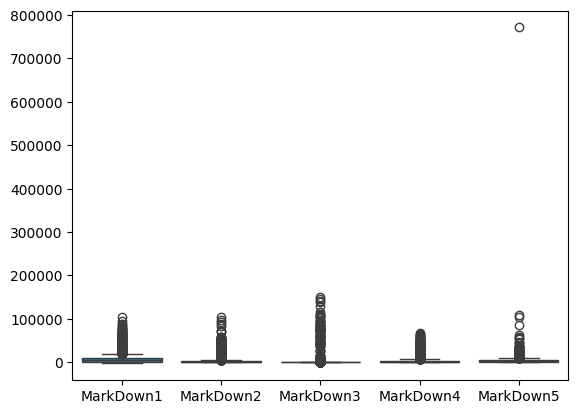

In [26]:
sns.boxplot(df1[markdown_columns])

In [27]:
def remove_outliers(df, columns):
    for column in columns:
        Q1 = df[column].quantile(0.15)
        Q3 = df[column].quantile(0.85)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df

# Remove outliers from the specified columns
df1 = remove_outliers(df1, markdown_columns)
df1

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday,Year,Month,Day,Type,Size
92,1,2011-11-11,59.11,3.297,10382.90,6115.67,215.07,2406.62,6551.42,217.998085,7.866,0,2011,11,11,0,151315
93,1,2011-11-18,62.25,3.308,6074.12,254.39,51.98,427.39,5988.57,218.220509,7.866,0,2011,11,18,0,151315
96,1,2011-12-09,43.93,3.158,4640.65,19.00,105.02,3639.42,14461.82,218.961846,7.866,0,2011,12,9,0,151315
97,1,2011-12-16,51.63,3.159,5011.32,67.00,347.37,225.79,4011.37,219.179453,7.866,0,2011,12,16,0,151315
98,1,2011-12-23,47.96,3.112,2725.36,40.48,634.70,24.90,2739.43,219.357722,7.866,0,2011,12,23,0,151315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8185,45,2013-06-28,76.05,3.639,4842.29,975.03,3.00,2449.97,3169.69,NaN,NaN,0,2013,6,28,1,118221
8186,45,2013-07-05,77.50,3.614,9090.48,2268.58,582.74,5797.47,1514.93,NaN,NaN,0,2013,7,5,1,118221
8187,45,2013-07-12,79.37,3.614,3789.94,1827.31,85.72,744.84,2150.36,NaN,NaN,0,2013,7,12,1,118221
8188,45,2013-07-19,82.84,3.737,2961.49,1047.07,204.19,363.00,1059.46,NaN,NaN,0,2013,7,19,1,118221


In [28]:
df1['Date'].unique()

array(['2011-11-11', '2011-11-18', '2011-12-09', '2011-12-16',
       '2011-12-23', '2012-01-13', '2012-01-20', '2012-01-27',
       '2012-02-10', '2012-02-17', '2012-02-24', '2012-03-09',
       '2012-03-16', '2012-03-23', '2012-03-30', '2012-04-13',
       '2012-04-20', '2012-06-01', '2012-06-08', '2012-06-15',
       '2012-06-22', '2012-07-06', '2012-07-13', '2012-07-20',
       '2012-07-27', '2012-08-03', '2012-08-10', '2012-08-17',
       '2012-08-24', '2012-08-31', '2012-09-07', '2012-09-14',
       '2012-09-21', '2012-09-28', '2012-10-26', '2012-11-02',
       '2012-11-09', '2012-11-16', '2013-01-18', '2013-01-25',
       '2013-03-01', '2013-03-08', '2013-04-05', '2013-04-12',
       '2013-04-19', '2013-05-03', '2013-05-10', '2013-05-17',
       '2013-05-31', '2013-06-07', '2013-06-14', '2013-06-21',
       '2013-06-28', '2013-07-12', '2013-07-19', '2013-07-26',
       '2012-03-02', '2012-04-06', '2012-12-21', '2013-01-11',
       '2013-02-01', '2013-02-15', '2013-02-22', '2013-

<Axes: >

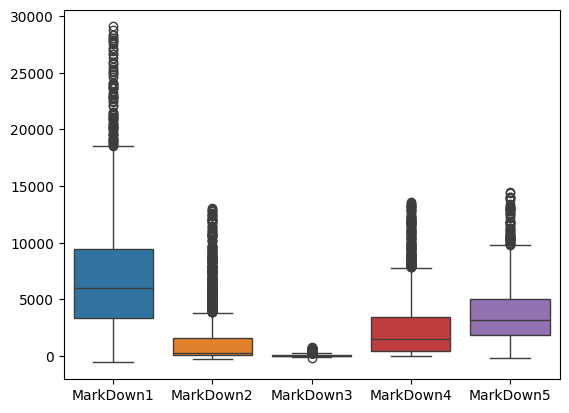

In [29]:
sns.boxplot(df1[markdown_columns])

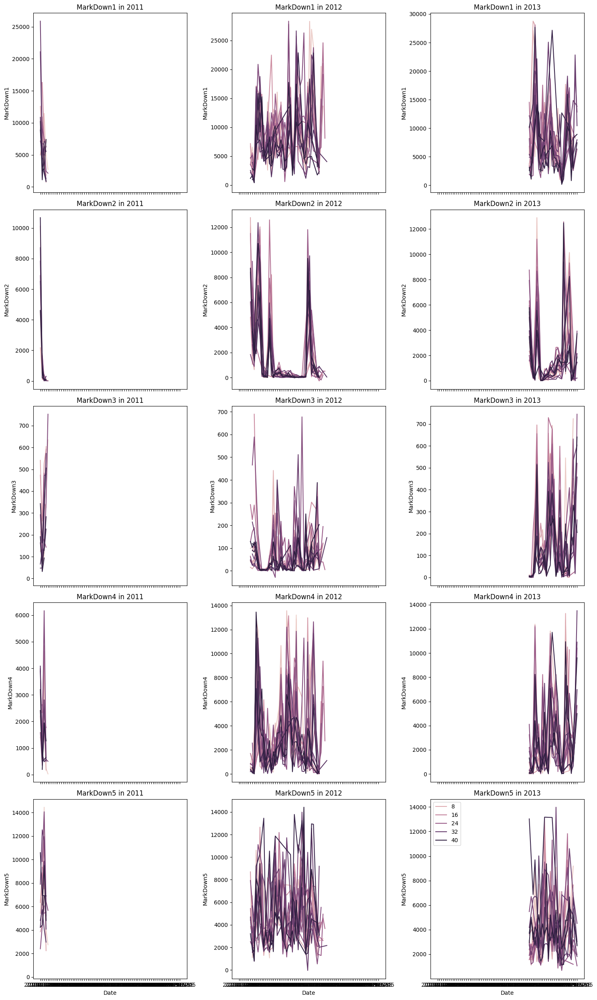

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns
df1a = df1[df1['Type']==0]
markdown_columns = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']
fig, axes = plt.subplots(5, 3, figsize=(15, 25), sharex=True)
for i, markdown in enumerate(markdown_columns):
    for j, year in enumerate([2011, 2012, 2013]):
        ax = axes[i, j]
        sns.lineplot(data=df1a[df1a['Year'] == year], x='Date', y=markdown, hue='Store', ax=ax)
        ax.set_title(f'{markdown} in {year}')
        ax.legend().remove()
        if j == 0:
            ax.set_ylabel(markdown)
        if i == len(markdown_columns) - 1:
            ax.set_xlabel('Date')
plt.tight_layout()
plt.legend()
plt.show()

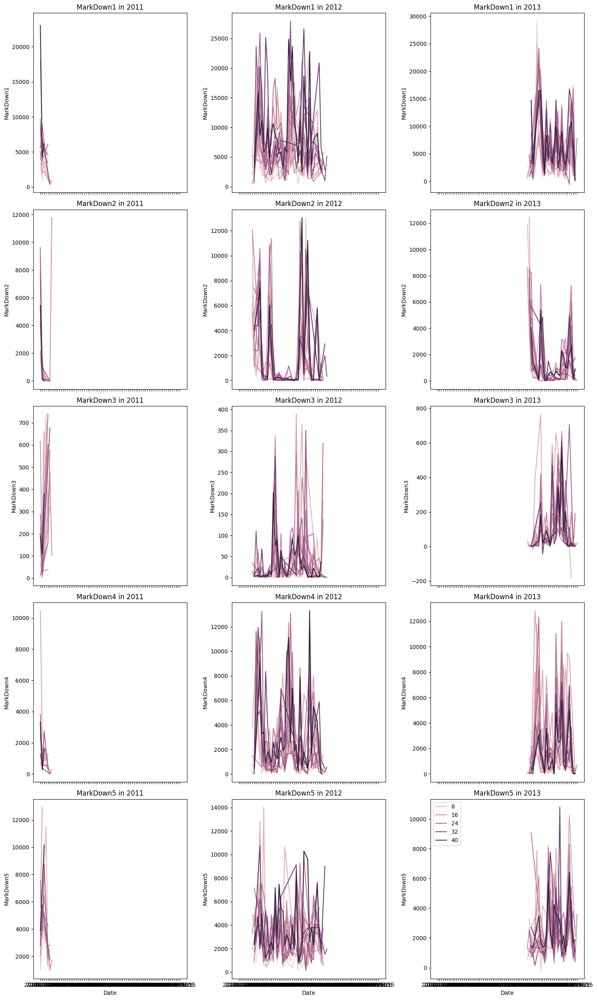

In [33]:
df1b = df1[df1['Type']==1]
markdown_columns = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']
fig, axes = plt.subplots(5, 3, figsize=(15, 25), sharex=True)
for i, markdown in enumerate(markdown_columns):
    for j, year in enumerate([2011, 2012, 2013]):
        ax = axes[i, j]
        sns.lineplot(data=df1b[df1b['Year'] == year], x='Date', y=markdown, hue='Store', ax=ax)
        ax.set_title(f'{markdown} in {year}')
        ax.legend().remove()
        if j == 0:
            ax.set_ylabel(markdown)
        if i == len(markdown_columns) - 1:
            ax.set_xlabel('Date')
plt.tight_layout()
plt.legend()
plt.show()

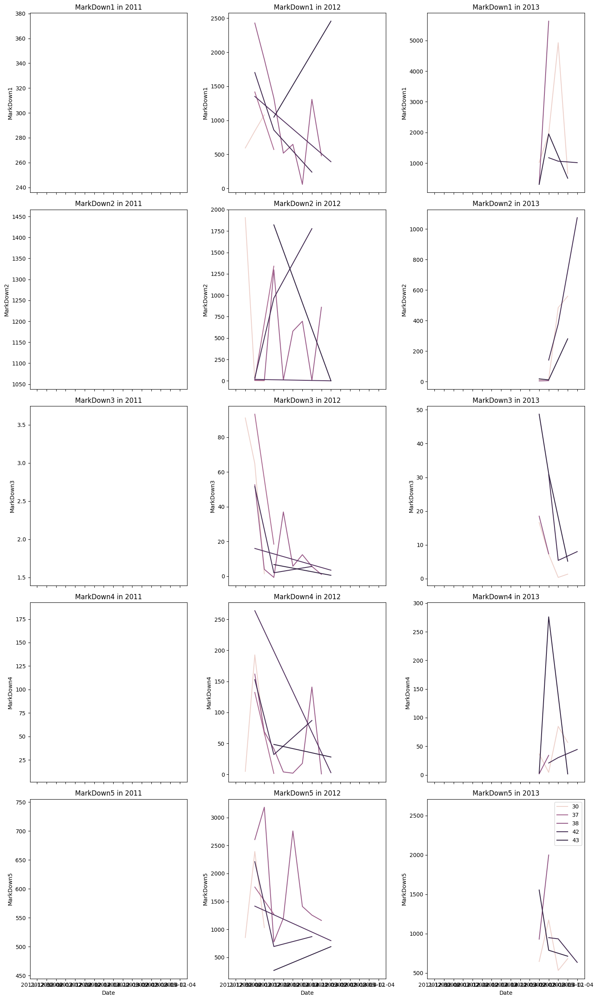

In [34]:
df1c = df1[df1['Type']==2]
markdown_columns = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']
fig, axes = plt.subplots(5, 3, figsize=(15, 25), sharex=True)
for i, markdown in enumerate(markdown_columns):
    for j, year in enumerate([2011, 2012, 2013]):
        ax = axes[i, j]
        sns.lineplot(data=df1c[df1c['Year'] == year], x='Date', y=markdown, hue='Store', ax=ax)
        ax.set_title(f'{markdown} in {year}')
        ax.legend().remove()
        if j == 0:
            ax.set_ylabel(markdown)
        if i == len(markdown_columns) - 1:
            ax.set_xlabel('Date')
plt.tight_layout()
plt.legend()
plt.show()

In [30]:
df1.isnull().sum()

Store             0
Date              0
Temperature       0
Fuel_Price        0
MarkDown1         0
MarkDown2         0
MarkDown3         0
MarkDown4         0
MarkDown5         0
CPI             412
Unemployment    412
IsHoliday         0
Year              0
Month             0
Day               0
Type              0
Size              0
dtype: int64

Based on the above visualizations, we can deduce that the dependence of all the markdowns on the target variables are very low. Also keeping in mind their very less data in the dataset, we can drop the columns.

Although the Stores of Type C show slight coherence in the visualizations, as the data is very less and inconsistent with the dates we can drop the columns.

In [23]:
df.drop(columns=['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5'],inplace = True)
df

,Store,Date,Temperature,Fuel_Price,CPI,Unemployment,IsHoliday,Year,Month,Day,Type,Size
0,1,2010-02-05,42.31,2.572,211.096358,8.106,0,2010,2,5,0,151315
1,1,2010-02-12,38.51,2.548,211.242170,8.106,1,2010,2,12,0,151315
2,1,2010-02-19,39.93,2.514,211.289143,8.106,0,2010,2,19,0,151315
3,1,2010-02-26,46.63,2.561,211.319643,8.106,0,2010,2,26,0,151315
4,1,2010-03-05,46.50,2.625,211.350143,8.106,0,2010,3,5,0,151315
...,...,...,...,...,...,...,...,...,...,...,...,...
8185,45,2013-06-28,76.05,3.639,NaN,NaN,0,2013,6,28,1,118221
8186,45,2013-07-05,77.50,3.614,NaN,NaN,0,2013,7,5,1,118221
8187,45,2013-07-12,79.37,3.614,NaN,NaN,0,2013,7,12,1,118221
8188,45,2013-07-19,82.84,3.737,NaN,NaN,0,2013,7,19,1,118221


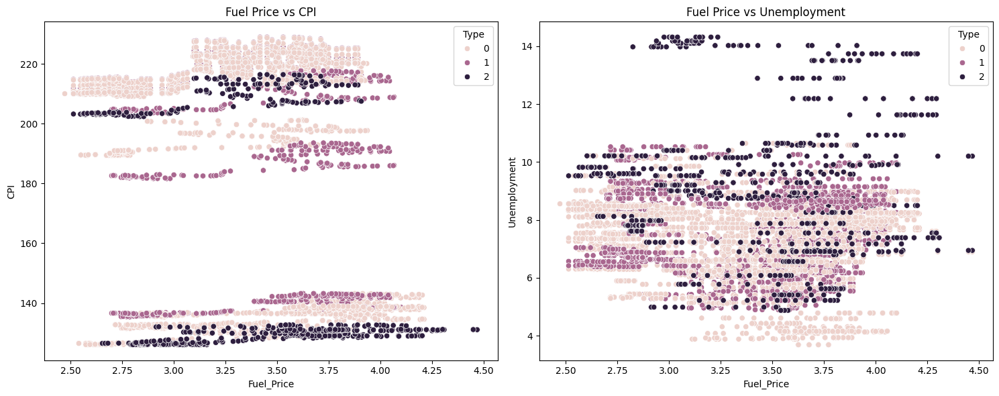

In [37]:
# Create the figure with 1 row and 2 columns for subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot 1: Fuel_Price vs. CPI
sns.scatterplot(data=df, x='Fuel_Price', y='CPI', hue='Type', ax=axes[0])
axes[0].set_title('Fuel Price vs CPI')

# Plot 2: Fuel_Price vs. Unemployment
sns.scatterplot(data=df, x='Fuel_Price', y='Unemployment', hue='Type', ax=axes[1])
axes[1].set_title('Fuel Price vs Unemployment')

plt.tight_layout()
plt.show()

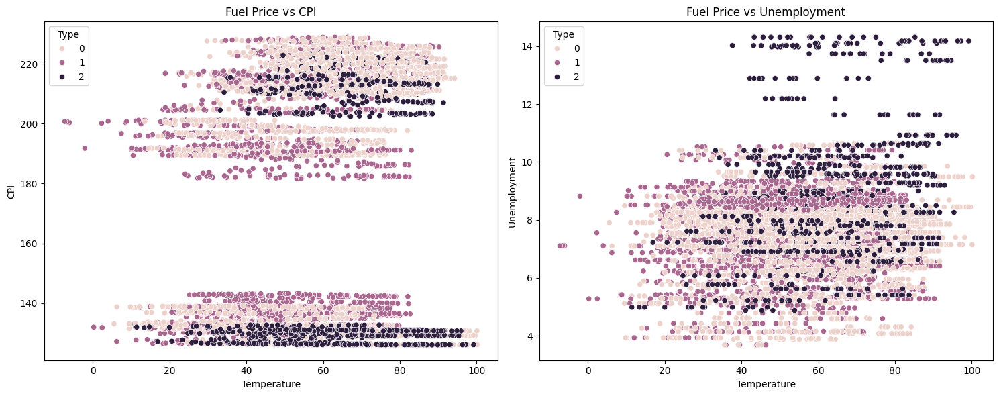

In [38]:
# Create the figure with 1 row and 2 columns for subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot 1: Fuel_Price vs. CPI
sns.scatterplot(data=df, x='Temperature', y='CPI', hue='Type', ax=axes[0])
axes[0].set_title('Fuel Price vs CPI')

# Plot 2: Fuel_Price vs. Unemployment
sns.scatterplot(data=df, x='Temperature', y='Unemployment', hue='Type', ax=axes[1])
axes[1].set_title('Fuel Price vs Unemployment')

plt.tight_layout()
plt.show()

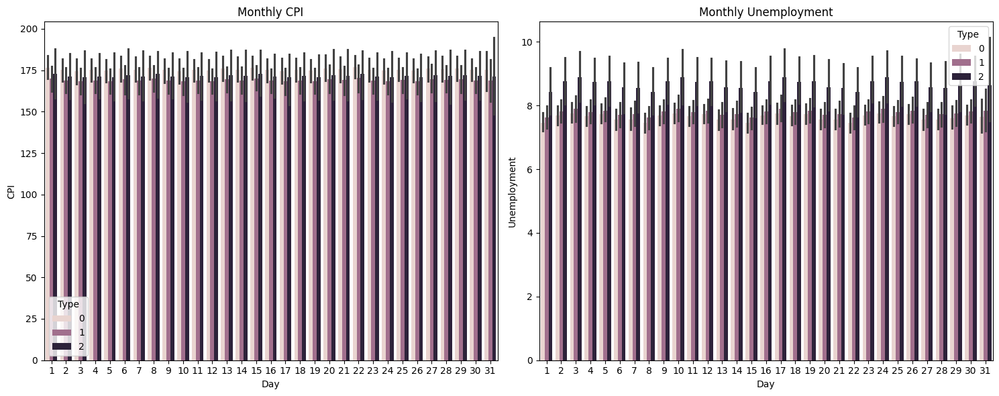

In [39]:
# Create the figure with 1 row and 2 columns for subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot 1: Fuel_Price vs. CPI
sns.barplot(data=df, x='Day', y='CPI', hue='Type', ax=axes[0])
axes[0].set_title('Monthly CPI')

# Plot 2: Fuel_Price vs. Unemployment
sns.barplot(data=df, x='Day', y='Unemployment', hue='Type', ax=axes[1])
axes[1].set_title('Monthly Unemployment')

plt.tight_layout()
plt.show()

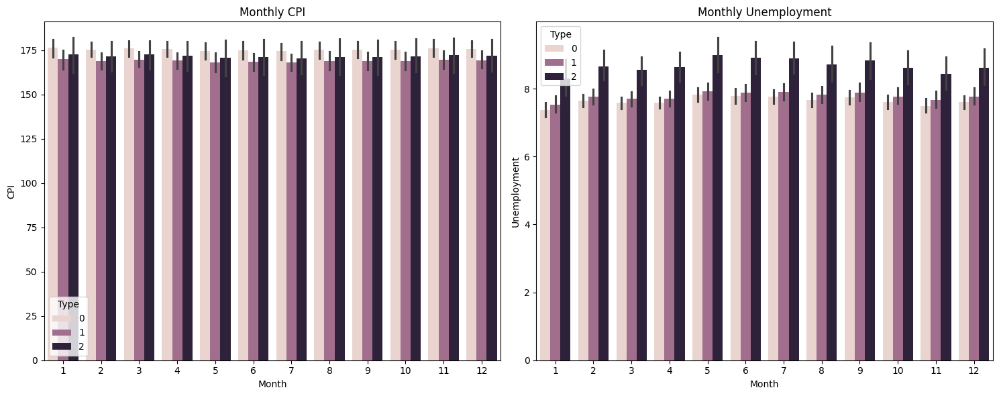

In [40]:
# Create the figure with 1 row and 2 columns for subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot 1: Fuel_Price vs. CPI
sns.barplot(data=df, x='Month', y='CPI', hue='Type', ax=axes[0])
axes[0].set_title('Monthly CPI')

# Plot 2: Fuel_Price vs. Unemployment
sns.barplot(data=df, x='Month', y='Unemployment', hue='Type', ax=axes[1])
axes[1].set_title('Monthly Unemployment')

plt.tight_layout()
plt.show()

From the above visualizations, the targets don't seem to vary much with change in Day or Month.


<ipython-input-41-93656bacc32b>:5: UserWarning: Ignoring `ax`; jointplot is a figure-level function.
  sns.jointplot(data=df, x='Type', y='CPI', hue='IsHoliday', ax=axes[0])
<ipython-input-41-93656bacc32b>:9: UserWarning: Ignoring `ax`; jointplot is a figure-level function.
  sns.jointplot(data=df, x='Type', y='Unemployment', hue='IsHoliday', ax=axes[1])


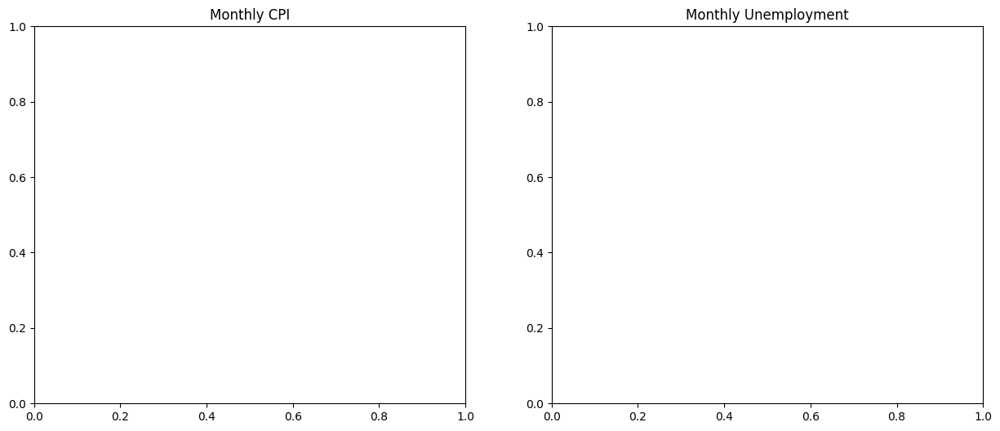

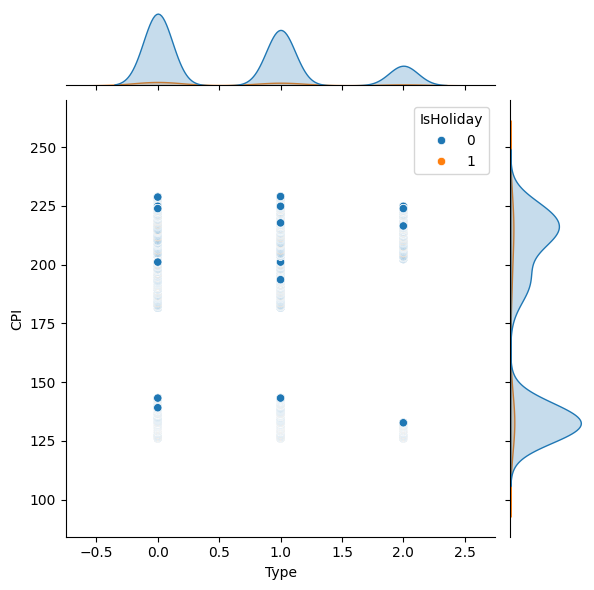

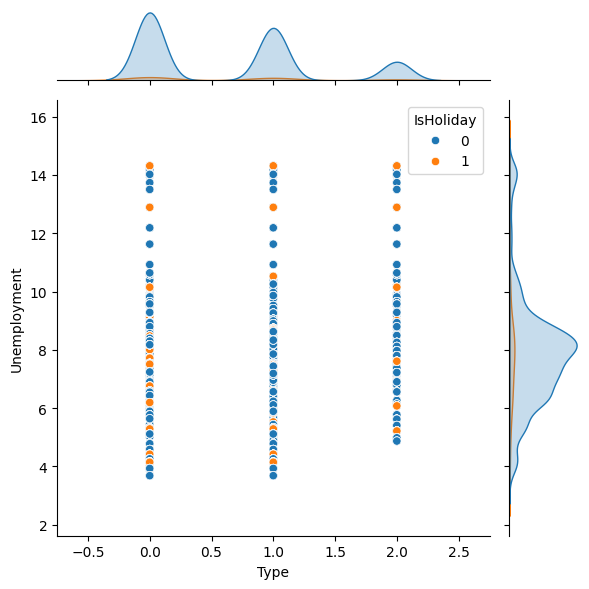

In [41]:
# Create the figure with 1 row and 2 columns for subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot 1: Fuel_Price vs. CPI
sns.jointplot(data=df, x='Type', y='CPI', hue='IsHoliday', ax=axes[0])
axes[0].set_title('Monthly CPI')

# Plot 2: Fuel_Price vs. Unemployment
sns.jointplot(data=df, x='Type', y='Unemployment', hue='IsHoliday', ax=axes[1])
axes[1].set_title('Monthly Unemployment')

plt.tight_layout()
plt.show()

The above visualizations show that the Holiday columns also doesn't have any dependency on the target variable.


In [32]:
df.columns

Index(['Store', 'Date', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment',
       'IsHoliday', 'Year', 'Month', 'Day', 'Type', 'Size'],
      dtype='object')

<Axes: >

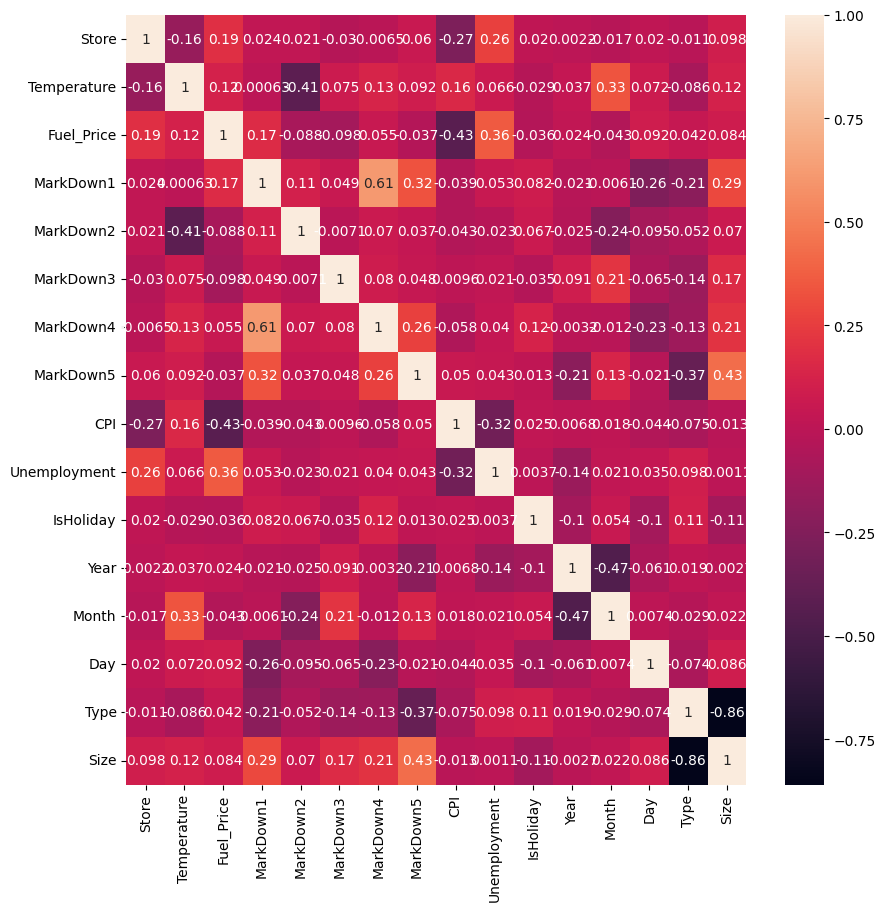

In [43]:
plt.figure(figsize=(10, 10))
sns.heatmap(df1.drop(columns=['Date']).corr(), annot=True)

<Axes: xlabel='Store', ylabel='CPI'>

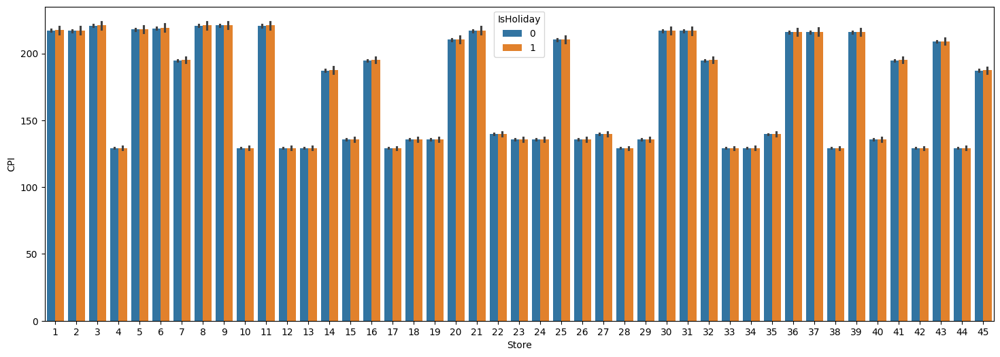

In [44]:
plt.figure(figsize=(18, 6))
sns.barplot(data = df, x = 'Store', y = 'CPI', hue = 'IsHoliday')

<Axes: xlabel='Store', ylabel='Unemployment'>

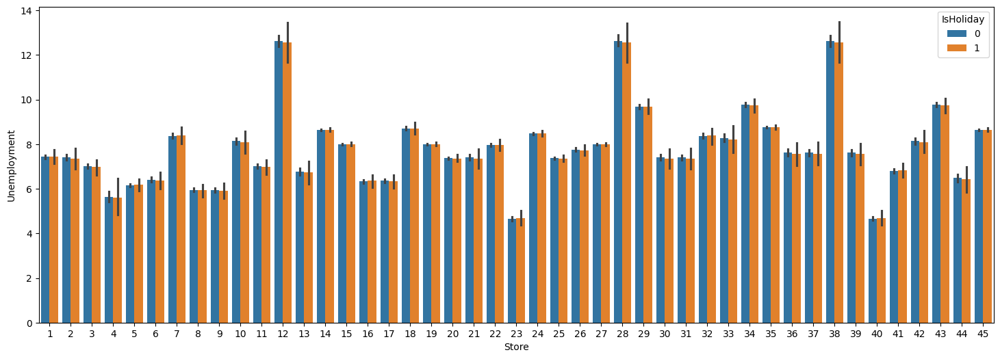

In [45]:
plt.figure(figsize=(18, 6))
sns.barplot(data = df, x = 'Store', y = 'Unemployment', hue = 'IsHoliday')

<Axes: xlabel='Date', ylabel='CPI'>

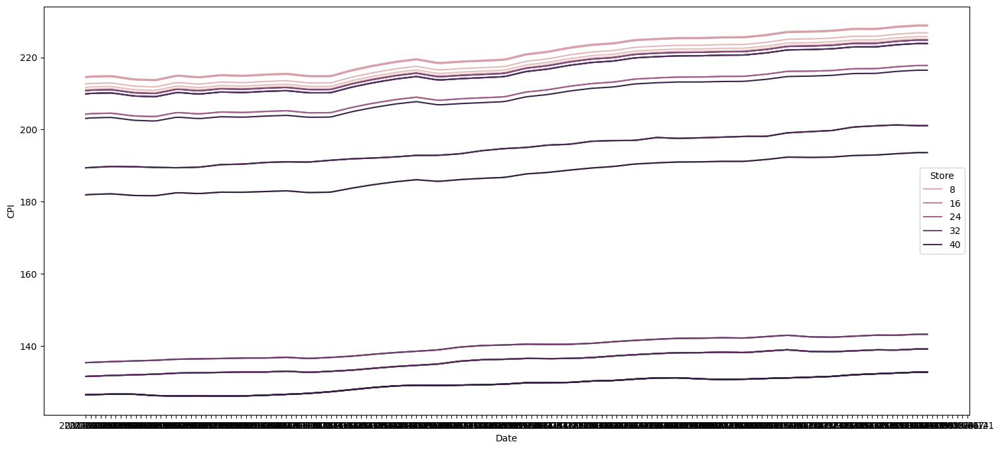

In [46]:
plt.figure(figsize=(18, 8))
sns.lineplot(data=df, x='Date', y='CPI', hue='Store')

<Axes: xlabel='Date', ylabel='Unemployment'>

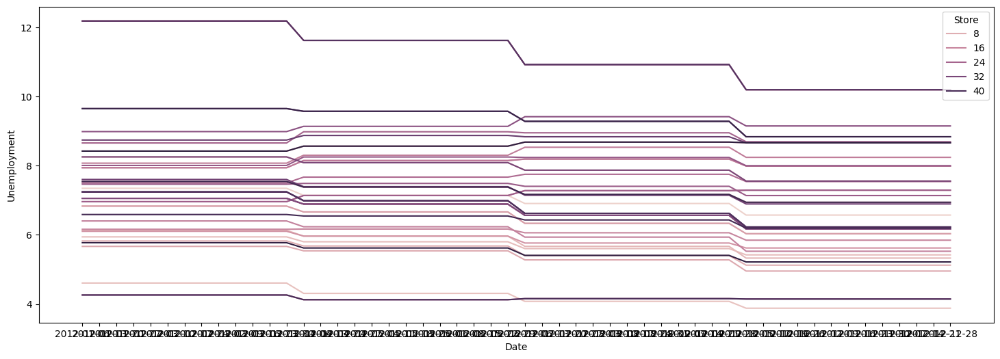

In [47]:
plt.figure(figsize=(18, 6))
sns.lineplot(data=df[df['Year']==2012], x='Date', y='Unemployment', hue='Store')

In [76]:
df['Date'].unique()

array(['2010-02-05', '2010-02-12', '2010-02-19', '2010-02-26',
       '2010-03-05', '2010-03-12', '2010-03-19', '2010-03-26',
       '2010-04-02', '2010-04-09', '2010-04-16', '2010-04-23',
       '2010-04-30', '2010-05-07', '2010-05-14', '2010-05-21',
       '2010-05-28', '2010-06-04', '2010-06-11', '2010-06-18',
       '2010-06-25', '2010-07-02', '2010-07-09', '2010-07-16',
       '2010-07-23', '2010-07-30', '2010-08-06', '2010-08-13',
       '2010-08-20', '2010-08-27', '2010-09-03', '2010-09-10',
       '2010-09-17', '2010-09-24', '2010-10-01', '2010-10-08',
       '2010-10-15', '2010-10-22', '2010-10-29', '2010-11-05',
       '2010-11-12', '2010-11-19', '2010-11-26', '2010-12-03',
       '2010-12-10', '2010-12-17', '2010-12-24', '2010-12-31',
       '2011-01-07', '2011-01-14', '2011-01-21', '2011-01-28',
       '2011-02-04', '2011-02-11', '2011-02-18', '2011-02-25',
       '2011-03-04', '2011-03-11', '2011-03-18', '2011-03-25',
       '2011-04-01', '2011-04-08', '2011-04-15', '2011-

In [24]:
# Assuming df is your DataFrame
df['Date'] = pd.to_datetime(df['Date'])
# Verify the change
print(df['Date'].dtype)

datetime64[ns]


In [25]:
df[['Date', 'CPI', 'Unemployment']].corr()

,Date,CPI,Unemployment
Date,1.000000,0.087536,-0.312953
CPI,0.087536,1.000000,-0.303110
Unemployment,-0.312953,-0.303110,1.000000


In [26]:
df[df['CPI'].isna()]['Date'].unique()

<DatetimeArray>
['2013-05-03 00:00:00', '2013-05-10 00:00:00', '2013-05-17 00:00:00',
 '2013-05-24 00:00:00', '2013-05-31 00:00:00', '2013-06-07 00:00:00',
 '2013-06-14 00:00:00', '2013-06-21 00:00:00', '2013-06-28 00:00:00',
 '2013-07-05 00:00:00', '2013-07-12 00:00:00', '2013-07-19 00:00:00',
 '2013-07-26 00:00:00']
Length: 13, dtype: datetime64[ns]

### Data Modeling

In [29]:
dfi = df[df['Date']< '2013-05-03 00:00:00']
dfi.shape

(7605, 12)

In [30]:
dfi.isnull().sum()

Store           0
Date            0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
IsHoliday       0
Year            0
Month           0
Day             0
Type            0
Size            0
dtype: int64

In [31]:
df13 = dfi[dfi['Year'] == 2013]
X_test = df13[['Store', 'Year', 'Month', 'Day', 'Temperature', 'Fuel_Price', 'IsHoliday', 'Type', 'Size']]
y_test = df13[['CPI', 'Unemployment']]

# Prepare the data
# Filter the DataFrame for the years 2010, 2011, and 2012
X_train = dfi[dfi['Year'].isin([2010, 2011, 2012])][['Store', 'Year', 'Month', 'Day', 'Temperature', 'Fuel_Price', 'IsHoliday', 'Type', 'Size']]
y_train = dfi[dfi['Year'].isin([2010, 2011, 2012])][['CPI', 'Unemployment']]


X_train['Year'] = pd.to_numeric(X_train['Year'])
X_train['Month'] = pd.to_numeric(X_train['Month'])
X_train['Day'] = pd.to_numeric(X_train['Day'])
X_test['Year'] = pd.to_numeric(X_test['Year'])
X_test['Month'] = pd.to_numeric(X_test['Month'])
X_test['Day'] = pd.to_numeric(X_test['Day'])

<ipython-input-31-d88002c05c3c>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test['Year'] = pd.to_numeric(X_test['Year'])
<ipython-input-31-d88002c05c3c>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test['Month'] = pd.to_numeric(X_test['Month'])
<ipython-input-31-d88002c05c3c>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pan

In [54]:
model = LinearRegression()

# Define the parameters grid
param_grid = {
    'fit_intercept': [True, False]
}

# Set up GridSearchCV
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_grid, cv=5, scoring='r2')

# Fit the model
random_search.fit(X_train, y_train)

# Get the best parameters
best_params = random_search.best_params_
print(f"Best parameters: {best_params}")

# Get the best model
best_model = random_search.best_estimator_

# Predict on the training set to evaluate (replace with test set in practice)
y_pred = best_model.predict(X_train)

# Evaluate the model using R² score
r2 = r2_score(y_train, y_pred)
print(f"Training R² score: {r2}")

# Predict on the test set
y_pred = best_model.predict(X_test)

# Evaluate the model using R² score
r2 = r2_score(y_test, y_pred)
print(f"Testing R² score: {r2}")

Best parameters: {'fit_intercept': True}
Training R² score: 0.22099245484869018
Testing R² score: -0.10964074132759649


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 2 is smaller than n_iter=10. Running 2 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


In [55]:
model = DecisionTreeRegressor()

# Define the parameters grid
param_grid = {
    'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
    'splitter': ['best', 'random'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'auto', 'sqrt', 'log2']
}

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_grid, cv=5, scoring='r2', n_iter=100, random_state=42, n_jobs=-1)

# Fit the model
random_search.fit(X_train, y_train)

# Get the best parameters
best_params = random_search.best_params_
print(f"Best parameters: {best_params}")

# Get the best model
best_model = random_search.best_estimator_

# Predict on the training set to evaluate (replace with test set in practice)
y_pred = best_model.predict(X_train)

# Evaluate the model using R² score
r2 = r2_score(y_train, y_pred)
print(f"Training R² score: {r2}")

# Predict on the test set
y_pred = best_model.predict(X_test)

# Evaluate the model using R² score
r2 = r2_score(y_test, y_pred)
print(f"Testing R² score: {r2}")

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


Best parameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10, 'criterion': 'squared_error'}
Training R² score: 0.4830532539651686
Testing R² score: 0.27529729144731624


In [56]:
# from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
# from sklearn.linear_model import LinearRegression
# from sklearn.tree import DecisionTreeRegressor
# from sklearn.ensemble import RandomForestRegressor
# from sklearn.metrics import r2_score
# from sklearn.linear_model import Ridge, Lasso
# from sklearn.preprocessing import StandardScaler
# from sklearn.decomposition import PCA



# pca = PCA()  # Initialize PCA without specifying the number of components
# X_train_pca = pca.fit_transform(X_train_scaled)
# X_test_pca = pca.transform(X_test_scaled)

# # Determine the optimal number of components based on explained variance ratio
# explained_variance_ratio = pca.explained_variance_ratio_
# cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

# # Find the number of components that explain a certain threshold of variance (e.g., 95%)
# n_components_threshold = np.argmax(cumulative_variance_ratio >= 0.95) + 1  # Add 1 because of zero-based indexing

# # Use the optimized number of components for PCA
# pca_optimized = PCA(n_components=n_components_threshold)
# X_train = pca_optimized.fit_transform(X_train_scaled)
# X_test = pca_optimized.transform(X_test_scaled)

# Print the optimized number of components and explained variance ratio
# print("Optimized Number of Components:", n_components_threshold)
# print("Explained Variance Ratio:", explained_variance_ratio[:n_components_threshold])

model = RandomForestRegressor(random_state=42)

# Define the parameters grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_grid, cv=5, scoring='r2', n_iter=10, random_state=42, n_jobs=-1)

# Fit the model
random_search.fit(X_train, y_train)

# Get the best parameters
best_params = random_search.best_params_
print(f"Best parameters: {best_params}")

# Get the best model
best_model = random_search.best_estimator_

# Predict on the training set to evaluate (replace with test set in practice)
y_pred = best_model.predict(X_train)

# Evaluate the model using R² score
r2 = r2_score(y_train, y_pred)
print(f"Training R² score: {r2}")

# Predict on the test set
y_pred = best_model.predict(X_test)

# Evaluate the model using R² score
r2 = r2_score(y_test, y_pred)
print(f"Testing R² score: {r2}")

Best parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_depth': None, 'bootstrap': True}
Training R² score: 0.9995907466497745
Testing R² score: 0.8286565660709837


In [57]:
model = KNeighborsRegressor()

# Define the parameters grid
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
}

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_grid, cv=5, scoring='r2', n_iter=10, random_state=42, n_jobs=-1)

# Fit the model
random_search.fit(X_train, y_train)

# Get the best parameters
best_params = random_search.best_params_
print(f"Best parameters: {best_params}")

# Get the best model
best_model = random_search.best_estimator_

# Predict on the training set to evaluate (replace with test set in practice)
y_pred = best_model.predict(X_train)

# Evaluate the model using R² score
r2 = r2_score(y_train, y_pred)
print(f"Training R² score: {r2}")

# Predict on the test set
y_pred = best_model.predict(X_test)

# Evaluate the model using R² score
r2 = r2_score(y_test, y_pred)
print(f"Testing R² score: {r2}")


Best parameters: {'weights': 'distance', 'n_neighbors': 11, 'algorithm': 'ball_tree'}
Training R² score: 1.0
Testing R² score: 0.5250283731054155


In [32]:
X = dfi[['Store', 'Year', 'Month', 'Day', 'Temperature', 'Fuel_Price', 'IsHoliday', 'Type', 'Size']]
y1 = dfi['Unemployment']
y2 = dfi['CPI']
df13 = dfi[dfi['Year'] == 2013]
X_test = df13[['Store', 'Year', 'Month', 'Day', 'Temperature', 'Fuel_Price', 'IsHoliday', 'Type', 'Size']]
y_test1 = df13['Unemployment']
y_test2 = df13['CPI']
# Prepare the data
# Filter the DataFrame for the years 2010, 2011, and 2012
X_train = dfi[dfi['Year'].isin([2010, 2011, 2012])][['Store', 'Year', 'Month', 'Day', 'Temperature', 'Fuel_Price', 'IsHoliday', 'Type', 'Size']]
y_train1 = dfi[dfi['Year'].isin([2010, 2011, 2012])]['Unemployment']
y_train2 = dfi[dfi['Year'].isin([2010, 2011, 2012])]['CPI']

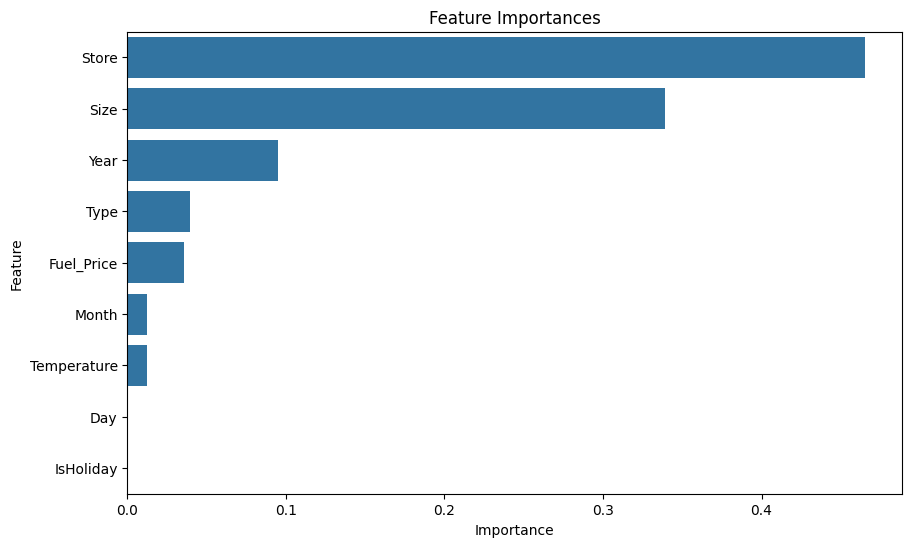

In [59]:
# Train the model for the target Unemployment
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X, y1)

# Get feature importances
feature_importances = model.feature_importances_
features = X.columns

# Create a DataFrame for plotting
importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

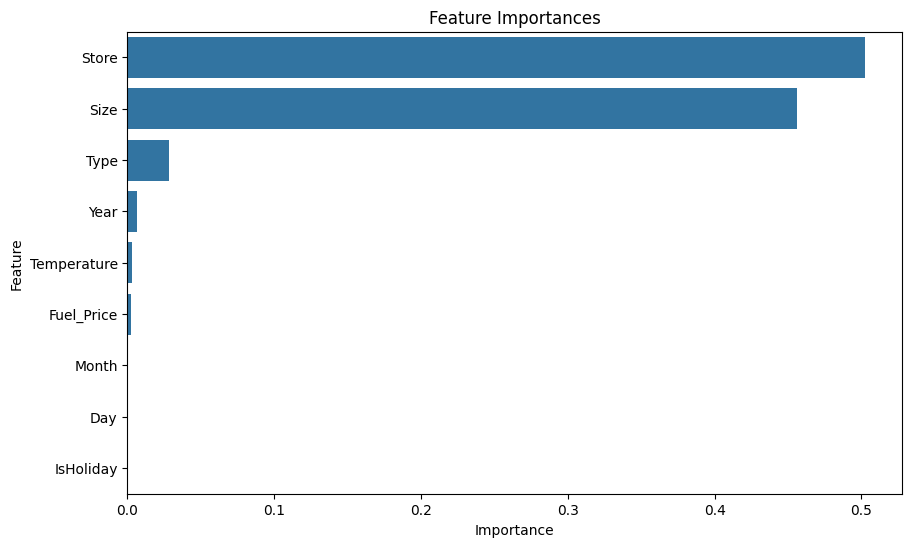

In [60]:
# Train the model for the target Unemployment
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X, y2)

# Get feature importances
feature_importances = model.feature_importances_
features = X.columns

# Create a DataFrame for plotting
importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [41]:
df13 = dfi[dfi['Year'] == 2013]
X_test = df13[['Store', 'Year', 'Month', 'Day', 'Temperature', 'Fuel_Price', 'Type', 'Size']]
y_test1 = df13['Unemployment']
y_test2 = df13['CPI']
# Prepare the data
# Filter the DataFrame for the years 2010, 2011, and 2012
X_train = dfi[dfi['Year'].isin([2010, 2011, 2012])][['Store', 'Year', 'Month', 'Day', 'Temperature', 'Fuel_Price', 'Type', 'Size']]
y_train1 = dfi[dfi['Year'].isin([2010, 2011, 2012])]['Unemployment']
y_train2 = dfi[dfi['Year'].isin([2010, 2011, 2012])]['CPI']

In [62]:
model = LinearRegression()

# Define the parameters grid
param_grid = {
    'fit_intercept': [True, False]
}

# Set up GridSearchCV
random_search1 = RandomizedSearchCV(estimator=model, param_distributions=param_grid, cv=5, scoring='r2')
random_search2 = RandomizedSearchCV(estimator=model, param_distributions=param_grid, cv=5, scoring='r2')
# Fit the model
random_search1.fit(X_train, y_train1)
random_search2.fit(X_train, y_train2)
# Get the best parameters
best_params1 = random_search1.best_params_
best_params2 = random_search2.best_params_
print(f"Best parameters for y1: {best_params1}")
print(f"Best parameters for y2: {best_params2}")

# Get the best model
best_model1 = random_search1.best_estimator_
best_model2 = random_search2.best_estimator_
# Predict on the training set to evaluate (replace with test set in practice)
y_pred1 = best_model1.predict(X_train)
y_pred2 = best_model2.predict(X_train)
# Evaluate the model using R² score
r2_1 = r2_score(y_train1, y_pred1)
r2_2 = r2_score(y_train2, y_pred2)
print(f"Training R² score for y1: {r2_1}")
print(f"Training R² score for y2: {r2_2}")
# Predict on the test set
y_pred1 = best_model1.predict(X_test)
y_pred2 = best_model2.predict(X_test)
# Evaluate the model using R² score
r2_1 = r2_score(y_test1, y_pred1)
r2_2 = r2_score(y_test2, y_pred2)
print(f"Testing R² score for y1: {r2_1}")
print(f"Testing R² score for y2: {r2_2}")

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 2 is smaller than n_iter=10. Running 2 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 2 is smaller than n_iter=10. Running 2 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best parameters for y1: {'fit_intercept': True}
Best parameters for y2: {'fit_intercept': True}
Training R² score for y1: 0.20764970127397409
Training R² score for y2: 0.23225605642475422
Testing R² score for y1: -0.11606715763062181
Testing R² score for y2: -0.09549719115476352


In [63]:
from sklearn.tree import DecisionTreeRegressor
model = DecisionTreeRegressor()

# Define the parameters grid
param_grid = {
    'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
    'splitter': ['best', 'random'],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'auto', 'sqrt', 'log2']
}

# Set up RandomizedSearchCV
random_search1 = RandomizedSearchCV(estimator=model, param_distributions=param_grid, cv=5, scoring='r2', n_iter=100, random_state=42, n_jobs=-1)
random_search2 = RandomizedSearchCV(estimator=model, param_distributions=param_grid, cv=10, scoring='r2', n_iter=100, random_state=42, n_jobs=-1)
random_search1.fit(X_train, y_train1)
random_search2.fit(X_train, y_train2)
# Get the best parameters
best_params1 = random_search1.best_params_
best_params2 = random_search2.best_params_
print(f"Best parameters for y1: {best_params1}")
print(f"Best parameters for y2: {best_params2}")

# Get the best model
best_model1 = random_search1.best_estimator_
best_model2 = random_search2.best_estimator_
# Predict on the training set to evaluate (replace with test set in practice)
y_pred1 = best_model1.predict(X_train)
y_pred2 = best_model2.predict(X_train)
# Evaluate the model using R² score
r2_1 = r2_score(y_train1, y_pred1)
r2_2 = r2_score(y_train2, y_pred2)
print(f"Training R² score for y1: {r2_1}")
print(f"Training R² score for y2: {r2_2}")
# Predict on the test set
y_pred1 = best_model1.predict(X_test)
y_pred2 = best_model2.predict(X_test)
# Evaluate the model using R² score
r2_1 = r2_score(y_test1, y_pred1)
r2_2 = r2_score(y_test2, y_pred2)
print(f"Testing R² score for y1: {r2_1}")
print(f"Testing R² score for y2: {r2_2}")

Best parameters for y1: {'splitter': 'best', 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 20, 'criterion': 'friedman_mse'}
Best parameters for y2: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10, 'criterion': 'squared_error'}
Training R² score for y1: 0.960075249421434
Training R² score for y2: 0.4698804091765627
Testing R² score for y1: 0.6919898487266135
Testing R² score for y2: 0.4346886411113656


In [64]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.pipeline import Pipeline

model = GradientBoostingRegressor()

# Define the parameters grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.5],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

random_search1 = RandomizedSearchCV(estimator=model, param_distributions=param_grid, cv=5, scoring='r2', n_iter=100, random_state=42, n_jobs=-1)
random_search2 = RandomizedSearchCV(estimator=model, param_distributions=param_grid, cv=10, scoring='r2', n_iter=100, random_state=42, n_jobs=-1)
random_search1.fit(X_train, y_train1)
random_search2.fit(X_train, y_train2)
# Get the best parameters
best_params1 = random_search1.best_params_
best_params2 = random_search2.best_params_
print(f"Best parameters for y1: {best_params1}")
print(f"Best parameters for y2: {best_params2}")

# Get the best model
best_model1 = random_search1.best_estimator_
best_model2 = random_search2.best_estimator_
# Predict on the training set to evaluate (replace with test set in practice)
y_pred1 = best_model1.predict(X_train)
y_pred2 = best_model2.predict(X_train)
# Evaluate the model using R² score
r2_1 = r2_score(y_train1, y_pred1)
r2_2 = r2_score(y_train2, y_pred2)
print(f"Training R² score for y1: {r2_1}")
print(f"Training R² score for y2: {r2_2}")
# Predict on the test set
y_pred1 = best_model1.predict(X_test)
y_pred2 = best_model2.predict(X_test)
# Evaluate the model using R² score
r2_1 = r2_score(y_test1, y_pred1)
r2_2 = r2_score(y_test2, y_pred2)
print(f"Testing R² score for y1: {r2_1}")
print(f"Testing R² score for y2: {r2_2}")

Best parameters for y1: {'subsample': 1.0, 'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_depth': 5, 'learning_rate': 0.01}
Best parameters for y2: {'subsample': 0.8, 'n_estimators': 50, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_depth': 7, 'learning_rate': 0.01}
Training R² score for y1: 0.48858043815457164
Training R² score for y2: 0.6255908955177776
Testing R² score for y1: 0.10046622726244869
Testing R² score for y2: 0.605975068734487


In [65]:
from sklearn.neighbors import KNeighborsRegressor
model = KNeighborsRegressor()

# Define the parameters grid
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [20, 30, 40, 50]
}

random_search1 = RandomizedSearchCV(estimator=model, param_distributions=param_grid, cv=5, scoring='r2', n_iter=100, random_state=42, n_jobs=-1)
random_search2 = RandomizedSearchCV(estimator=model, param_distributions=param_grid, cv=10, scoring='r2', n_iter=100, random_state=42, n_jobs=-1)
random_search1.fit(X_train, y_train1)
random_search2.fit(X_train, y_train2)
# Get the best parameters
best_params1 = random_search1.best_params_
best_params2 = random_search2.best_params_
print(f"Best parameters for y1: {best_params1}")
print(f"Best parameters for y2: {best_params2}")

# Get the best model
best_model1 = random_search1.best_estimator_
best_model2 = random_search2.best_estimator_
# Predict on the training set to evaluate (replace with test set in practice)
y_pred1 = best_model1.predict(X_train)
y_pred2 = best_model2.predict(X_train)
# Evaluate the model using R² score
r2_1 = r2_score(y_train1, y_pred1)
r2_2 = r2_score(y_train2, y_pred2)
print(f"Training R² score for y1: {r2_1}")
print(f"Training R² score for y2: {r2_2}")
# Predict on the test set
y_pred1 = best_model1.predict(X_test)
y_pred2 = best_model2.predict(X_test)
# Evaluate the model using R² score
r2_1 = r2_score(y_test1, y_pred1)
r2_2 = r2_score(y_test2, y_pred2)
print(f"Testing R² score for y1: {r2_1}")
print(f"Testing R² score for y2: {r2_2}")

Best parameters for y1: {'weights': 'uniform', 'n_neighbors': 11, 'leaf_size': 40, 'algorithm': 'kd_tree'}
Best parameters for y2: {'weights': 'distance', 'n_neighbors': 7, 'leaf_size': 30, 'algorithm': 'brute'}
Training R² score for y1: 0.8322560246125824
Training R² score for y2: 1.0
Testing R² score for y1: 0.03889841972103103
Testing R² score for y2: 0.9762444783640296


In [69]:
model = RandomForestRegressor(random_state=42)
# Define the parameters grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}
# Set up RandomizedSearchCV
random_search1 = RandomizedSearchCV(estimator=model, param_distributions=param_grid, cv=5, scoring='r2', n_iter=100, random_state=42, n_jobs=-1)
random_search2 = RandomizedSearchCV(estimator=model, param_distributions=param_grid, cv=10, scoring='r2', n_iter=100, random_state=42, n_jobs=-1)
random_search1.fit(X_train, y_train1)
random_search2.fit(X_train, y_train2)
# Get the best parameters
best_params1 = random_search1.best_params_
best_params2 = random_search2.best_params_
print(f"Best parameters for y1: {best_params1}")
print(f"Best parameters for y2: {best_params2}")
# Get the best model
best_model1 = random_search1.best_estimator_
best_model2 = random_search2.best_estimator_
# Predict on the training set to evaluate (replace with test set in practice)
y_pred1 = best_model1.predict(X_train)
y_pred2 = best_model2.predict(X_train)
# Evaluate the model using R² score
r2_1 = r2_score(y_train1, y_pred1)
r2_2 = r2_score(y_train2, y_pred2)
print(f"Training R² score for y1: {r2_1}")
print(f"Training R² score for y2: {r2_1}")
# Predict on the test set
y_pred1 = best_model1.predict(X_test)
y_pred2 = best_model2.predict(X_test)
# Evaluate the model using R² score
r2_1 = r2_score(y_test1, y_pred1)
r2_2 = r2_score(y_test2, y_pred2)
print(f"Testing R² score for y1: {r2_2}")
print(f"Testing R² score for y2: {r2_2}")

/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


Best parameters for y1: {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': 30, 'bootstrap': False}
Best parameters for y2: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_depth': 10, 'bootstrap': True}
Training R² score for y1: 0.9999358989872534
Training R² score for y2: 0.9999358989872534
Testing R² score for y1: 0.9946032160756729
Testing R² score for y2: 0.9946032160756729


In [72]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import BayesianRidge

# Set up the Bayesian Regression model
model1 = BayesianRidge()
model2 = BayesianRidge()

# Define the parameters grid (BayesianRidge does not have hyperparameters to tune)

# Fit the model
model1.fit(X_train, y_train1)
model2.fit(X_train, y_train2)

y_pred1 = model1.predict(X_train)
y_pred2 = model2.predict(X_train)
# Evaluate the model using R² score
r2_1 = r2_score(y_train1, y_pred1)
r2_2 = r2_score(y_train2, y_pred2)
print(f"Training R² score for y1: {r2_1}")
print(f"Training R² score for y2: {r2_2}")
# Predict on the test set
y_pred1 = best_model1.predict(X_test)
y_pred2 = best_model2.predict(X_test)
# Evaluate the model using R² score
r2_1 = r2_score(y_test1, y_pred1)
r2_2 = r2_score(y_test2, y_pred2)
print(f"Testing R² score for y1: {r2_1}")
print(f"Testing R² score for y2: {r2_2}")


Training R² score for y1: 0.20763928321024416
Training R² score for y2: 0.23225078897213602
Testing R² score for y1: 0.6937728962232963
Testing R² score for y2: 0.9946032160756729


In [73]:
from sklearn.neural_network import MLPRegressor

# Set up the Fully Connected Neural Network model
model = MLPRegressor()

# Define the parameters grid
param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (100, 50), (200, 100)],
    'activation': ['relu', 'tanh', 'logistic'],
    'solver': ['adam', 'sgd'],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['constant', 'adaptive'],
}

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=model, param_distributions=param_grid, cv=5, scoring='r2', n_iter=10, random_state=42, n_jobs=-1)

# Fit the model
random_search.fit(X_train, y_train1)

# Get the best parameters
best_params = random_search.best_params_
print(f"Best parameters: {best_params}")

# Get the best model
best_model = random_search.best_estimator_

# Predict on the training set to evaluate
y_pred = best_model.predict(X_train)
# Evaluate the model using R² score
r2 = r2_score(y_train1, y_pred)
print(f"Training R² score: {r2}")

# Predict on the test set
y_pred = best_model.predict(X_test)

# Evaluate the model using R² score
r2 = r2_score(y_test1, y_pred)
print(f"Testing R² score: {r2}")


Best parameters: {'solver': 'sgd', 'learning_rate': 'constant', 'hidden_layer_sizes': (100,), 'alpha': 0.001, 'activation': 'logistic'}
Training R² score: 0.0014270692506519467
Testing R² score: -0.4226451100451789


In [52]:
df

,Store,Temperature,Fuel_Price,CPI,IsHoliday,Year,Month,Day,Type,Size,CPI_target
0,2,46.556897,4.162588,220.575923,1,2011,10,5,0,19836,183.666410
1,2,55.507893,4.512243,182.362584,0,2010,10,27,2,10248,229.589789
2,4,34.490573,4.955793,189.831715,1,2010,10,2,1,8155,249.002741
3,4,53.086231,2.005835,195.508952,1,2012,6,19,2,6175,225.762108
4,1,49.896904,3.066245,198.632660,0,2011,4,22,1,12042,226.993399
...,...,...,...,...,...,...,...,...,...,...,...
95,2,64.924114,4.308357,211.795910,0,2010,5,2,1,3057,242.464008
96,1,91.321873,4.519378,247.648340,1,2011,11,13,2,10316,189.172792
97,4,89.961449,4.772224,189.043333,0,2010,11,26,1,3776,184.359043
98,3,62.720545,4.784125,220.430757,1,2010,2,25,0,49068,243.181235


### Best Model : RandomForestRegressor

Training R² score for y1: 0.9999359383929279
Training R² score for y2: 0.9997534838234136
Training MSE for y1: 0.0002255308104867189
Training MSE for y2: 0.3844879527631109
Training MAE for y1: 0.0018157337789108084
Training MAE for y2: 0.3824620972882073
Testing R² score for y1: 0.6938333519017068
Testing R² score for y2: 0.9946071546721051
Testing MSE for y1: 0.7554626885821814
Testing MSE for y2: 9.283830496140608
Testing MAE for y1: 0.7076756797385638
Testing MAE for y2: 2.6831573691020907


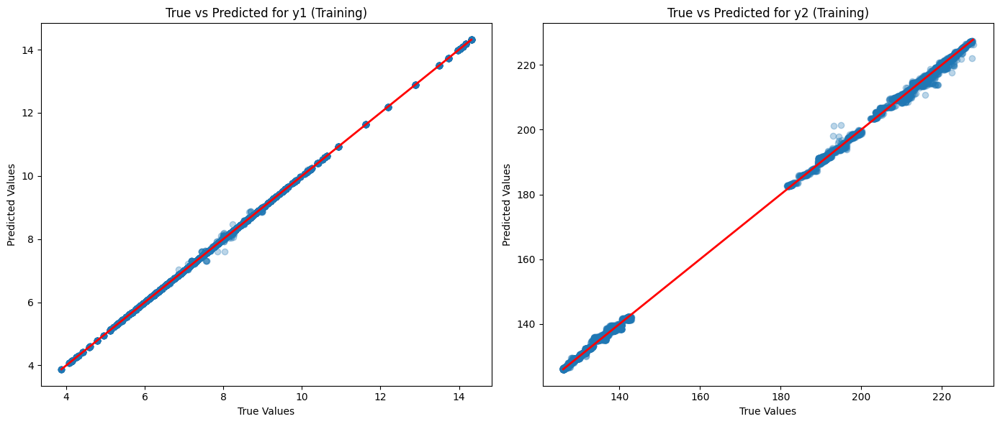

In [33]:
model1 = RandomForestRegressor(random_state=42, n_estimators = 200, min_samples_split= 5, min_samples_leaf= 4, max_depth= 30, bootstrap= False)
model2 = RandomForestRegressor(random_state=42, n_estimators = 100, min_samples_split= 2, min_samples_leaf= 4, max_depth= 10, bootstrap= True)
# Best parameters for y1: {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': 30, 'bootstrap': False}
# Best parameters for y2: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_depth': 10, 'bootstrap': True}
# param_grid = {
#     'n_estimators': [100, 200, 300],
#     'max_depth': [None, 10, 20, 30],
#     'min_samples_split': [2, 5, 10],
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
import seaborn as sns

# Fit the models
model1.fit(X_train, y_train1)
model2.fit(X_train, y_train2)

# Predict on the training set
y_pred1_train = model1.predict(X_train)
y_pred2_train = model2.predict(X_train)

# Evaluate the models using R² score, MSE, and MAE
r2_train_1 = r2_score(y_train1, y_pred1_train)
r2_train_2 = r2_score(y_train2, y_pred2_train)

mse_train_1 = mean_squared_error(y_train1, y_pred1_train)
mse_train_2 = mean_squared_error(y_train2, y_pred2_train)

mae_train_1 = mean_absolute_error(y_train1, y_pred1_train)
mae_train_2 = mean_absolute_error(y_train2, y_pred2_train)

print(f"Training R² score for y1: {r2_train_1}")
print(f"Training R² score for y2: {r2_train_2}")

print(f"Training MSE for y1: {mse_train_1}")
print(f"Training MSE for y2: {mse_train_2}")

print(f"Training MAE for y1: {mae_train_1}")
print(f"Training MAE for y2: {mae_train_2}")

# Predict on the test set
y_pred1_test = model1.predict(X_test)
y_pred2_test = model2.predict(X_test)

# Evaluate the models on the test set using R² score, MSE, and MAE
r2_test_1 = r2_score(y_test1, y_pred1_test)
r2_test_2 = r2_score(y_test2, y_pred2_test)

mse_test_1 = mean_squared_error(y_test1, y_pred1_test)
mse_test_2 = mean_squared_error(y_test2, y_pred2_test)

mae_test_1 = mean_absolute_error(y_test1, y_pred1_test)
mae_test_2 = mean_absolute_error(y_test2, y_pred2_test)

print(f"Testing R² score for y1: {r2_test_1}")
print(f"Testing R² score for y2: {r2_test_2}")

print(f"Testing MSE for y1: {mse_test_1}")
print(f"Testing MSE for y2: {mse_test_2}")

print(f"Testing MAE for y1: {mae_test_1}")
print(f"Testing MAE for y2: {mae_test_2}")

# Plotting true vs predicted values
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.scatter(y_train1, y_pred1_train, alpha=0.3)
plt.plot([min(y_train1), max(y_train1)], [min(y_train1), max(y_train1)], color='red', lw=2)
plt.title('True vs Predicted for y1 (Training)')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')

plt.subplot(1, 2, 2)
plt.scatter(y_train2, y_pred2_train, alpha=0.3)
plt.plot([min(y_train2), max(y_train2)], [min(y_train2), max(y_train2)], color='red', lw=2)
plt.title('True vs Predicted for y2 (Training)')
plt.xlabel('True Values')
plt.ylabel('Predicted Values')

plt.tight_layout()
plt.show()


In [37]:
df_test = df[df['Date'] >= '2013-05-03 00:00:00']
X_t = df_test[['Store', 'Year', 'Month', 'Day', 'Temperature', 'Fuel_Price', 'Type', 'Size']]
y_1 = df_test['Unemployment']
y_2 = df_test['CPI']
df_train = df[df['Date'] < '2013-05-03 00:00:00']
X_train = df_train[['Store', 'Year', 'Month', 'Day', 'Temperature', 'Fuel_Price', 'Type', 'Size']]
y_train1 = df_train['Unemployment']
y_train2 = df_train['CPI']

In [35]:
df_test.isnull().sum()

Store             0
Date              0
Temperature       0
Fuel_Price        0
CPI             585
Unemployment    585
IsHoliday         0
Year              0
Month             0
Day               0
Type              0
Size              0
dtype: int64

In [38]:
model1 = RandomForestRegressor(random_state=42, n_estimators = 200, min_samples_split= 5, min_samples_leaf= 4, max_depth= 30, bootstrap= False)
model2 = RandomForestRegressor(random_state=42, n_estimators = 100, min_samples_split= 2, min_samples_leaf= 4, max_depth= 10, bootstrap= True)

model1.fit(X_train, y_train1)
model2.fit(X_train, y_train2)
# Get the best parameters


y_pred1 = model1.predict(X_train)
y_pred2 = model2.predict(X_train)

# Evaluate the model using R² score
r2_1 = r2_score(y_train1, y_pred1)
r2_2 = r2_score(y_train2, y_pred2)
print(f"Training R² score for y1: {r2_1}")
print(f"Training R² score for y2: {r2_1}")

Training R² score for y1: 0.9986939346325658
Training R² score for y2: 0.9986939346325658


In [43]:
y_pred1 = model1.predict(X_t)
y_pred2 = model2.predict(X_t)
df_test['Unemployment'] = y_pred1
df_test['CPI'] = y_pred2

<ipython-input-43-dfb526b1b29b>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['Unemployment'] = y_pred1
<ipython-input-43-dfb526b1b29b>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test['CPI'] = y_pred2


In [44]:
df_test

,Store,Date,Temperature,Fuel_Price,CPI,Unemployment,IsHoliday,Year,Month,Day,Type,Size
169,1,2013-05-03,66.66,3.386,224.868383,6.314,0,2013,5,3,0,151315
170,1,2013-05-10,63.90,3.392,224.868383,6.314,0,2013,5,10,0,151315
171,1,2013-05-17,69.53,3.454,224.871125,6.314,0,2013,5,17,0,151315
172,1,2013-05-24,77.19,3.494,224.871125,6.314,0,2013,5,24,0,151315
173,1,2013-05-31,78.02,3.466,224.748988,6.314,0,2013,5,31,0,151315
...,...,...,...,...,...,...,...,...,...,...,...,...
8185,45,2013-06-28,76.05,3.639,192.036653,8.567,0,2013,6,28,1,118221
8186,45,2013-07-05,77.50,3.614,192.033792,8.684,0,2013,7,5,1,118221
8187,45,2013-07-12,79.37,3.614,192.036653,8.684,0,2013,7,12,1,118221
8188,45,2013-07-19,82.84,3.737,192.047218,8.684,0,2013,7,19,1,118221
